In [109]:
import os
from IPython.display import display, Image
import random
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras import layers, models
import pandas as pd
import matplotlib.pyplot as plt

LOAD DATA


In [110]:
data=tf.keras.utils.image_dataset_from_directory('img')


Found 99 files belonging to 5 classes.


In [111]:
data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [ ]:
for element in data:
    images, labels = element
    for i in range(len(images)):
        # Assuming you are using matplotlib to display images
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(f"Label: {labels[i].numpy()}")
        plt.show()


In [ ]:
    print(f"Type of element: {type(element)}")
    print(f"Type of images: {type(images)}")
    print(f"Type of labels: {type(labels)}")

In [112]:
# Check the size of the images
image_size = data.element_spec[0].shape[1:3]
print("Image size:", image_size)

Image size: (256, 256)


In [113]:
data_iterator=data.as_numpy_iterator()
batch=data_iterator.next()
#image representative as numpy array
print(len(batch))
batch[0].shape
batch[1]

2


array([1, 0, 3, 2, 4, 4, 3, 4, 3, 1, 0, 1, 2, 0, 4, 1, 2, 4, 1, 3, 4, 3,
       3, 4, 4, 3, 1, 2, 1, 0, 4, 0])

In [114]:
batch_size = batch[0].shape[0]
print("Batch size:", batch_size)

Batch size: 32


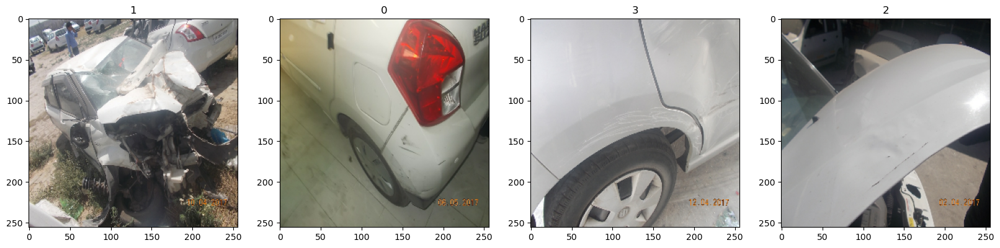

In [115]:
fig,ax=plt.subplots(ncols=4,figsize=(20,20))
for idx,img in enumerate(batch[0][:4]):
    ax[idx].imshow(img.astype(int))
    ax[idx].title.set_text(batch[1][idx])

Pre_Process Data

In [116]:
data=data.map(lambda x,y: (x/255 ,y))

In [117]:
data.as_numpy_iterator().next()

(array([[[[1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          ...,
          [0.2784314 , 0.3156863 , 0.34901962],
          [0.24509804, 0.27058825, 0.3372549 ],
          [0.19215687, 0.2509804 , 0.32352942]],
 
         [[1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          ...,
          [0.2882353 , 0.34313726, 0.37058824],
          [0.33137256, 0.35882354, 0.4117647 ],
          [0.22352941, 0.2509804 , 0.31764707]],
 
         [[1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          [1.        , 1.        , 1.        ],
          ...,
          [0.2901961 , 0.35686275, 0.3882353 ],
          [0.3745098 , 0.41764706, 0.46470588],
          [0.31960785, 0.3509804 , 0.39803922]],
 
         ...,
 
         [[0.2647059 , 0.26862746, 0.26666668],
          [0.27450

In [118]:
len(data) #represent batch size

4

In [160]:
train_size=int(len(data)*.7)-1
val_size=int(len(data)*.2)+1
test_size=int(len(data)*.1)+1

In [161]:
print(train_size,val_size,test_size)

1 1 1


In [162]:
train=data.take(train_size)
val=data.skip(train_size).take(val_size)
test=data.skip(train_size+val_size).take(test_size)

In [163]:
#Assuming 4 classes (adjust as needed)
num_classes = 5

# Image size
img_height, img_width = 256, 256

model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(256, activation='relu'),
    layers.Dense(num_classes, activation='softmax')  # Multi-class classification, so using softmax activation
])

In [164]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 30, 30, 128)      

In [165]:
# Compile the model
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

TRAin model


In [166]:
logsdir='.\logs'

In [167]:
tensorboard_callback=tf.keras.callbacks.TensorBoard(log_dir=logsdir)

In [168]:
hist=model.fit(train,epochs=30,validation_data=val,callbacks=[tensorboard_callback])

Epoch 1/30


1/1 [==============================] - 7s 7s/step - loss: 1.5998 - accuracy: 0.2812 - val_loss: 10.8277 - val_accuracy: 0.3125
Epoch 2/30
1/1 [==============================] - 4s 4s/step - loss: 10.5068 - accuracy: 0.3125 - val_loss: 10.2586 - val_accuracy: 0.2500
Epoch 3/30
1/1 [==============================] - 5s 5s/step - loss: 10.2464 - accuracy: 0.2500 - val_loss: 4.4767 - val_accuracy: 0.1875
Epoch 4/30
1/1 [==============================] - 4s 4s/step - loss: 3.4642 - accuracy: 0.2188 - val_loss: 1.8618 - val_accuracy: 0.2500
Epoch 5/30
1/1 [==============================] - 4s 4s/step - loss: 1.8086 - accuracy: 0.3438 - val_loss: 1.7083 - val_accuracy: 0.1875
Epoch 6/30
1/1 [==============================] - 3s 3s/step - loss: 1.6478 - accuracy: 0.1875 - val_loss: 1.5647 - val_accuracy: 0.1250
Epoch 7/30
1/1 [==============================] - 3s 3s/step - loss: 1.5936 - accuracy: 0.0938 - val_loss: 1.5586 - val_accuracy: 0.2812
Epoch 8/30
1/1 [==============================] 

In [169]:
hist.history

{'loss': [1.5997612476348877,
  10.506750106811523,
  10.246397018432617,
  3.4641551971435547,
  1.8085508346557617,
  1.6478056907653809,
  1.5935626029968262,
  1.5748027563095093,
  1.54622483253479,
  1.653505802154541,
  1.400322437286377,
  1.477862000465393,
  1.445319414138794,
  1.3586342334747314,
  1.3641314506530762,
  1.1658964157104492,
  1.0848157405853271,
  1.0254074335098267,
  0.8804193735122681,
  0.9303435683250427,
  0.8030865788459778,
  0.6832385063171387,
  0.5081362724304199,
  0.47450315952301025,
  0.27615848183631897,
  0.42313385009765625,
  0.2604549825191498,
  0.3618007004261017,
  0.14251382648944855,
  0.28715115785598755],
 'accuracy': [0.28125,
  0.3125,
  0.25,
  0.21875,
  0.34375,
  0.1875,
  0.09375,
  0.3125,
  0.3125,
  0.1875,
  0.53125,
  0.25,
  0.5,
  0.46875,
  0.4375,
  0.6875,
  0.78125,
  0.625,
  0.84375,
  0.6875,
  0.71875,
  0.84375,
  0.84375,
  0.84375,
  0.96875,
  0.875,
  0.9375,
  0.84375,
  0.9375,
  0.9375],
 'val_loss': [

PLOT Performance

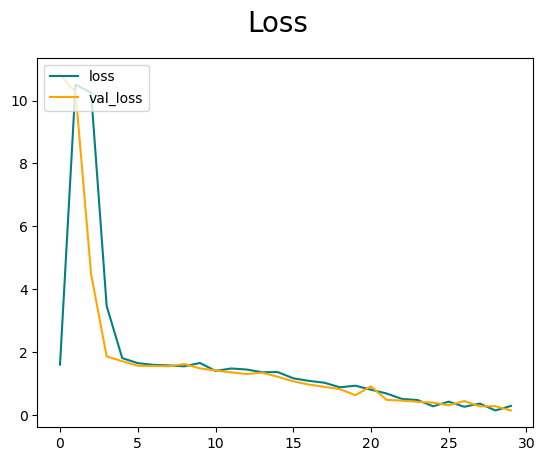

In [170]:
fig=plt.figure()
plt.plot(hist.history['loss'],color='teal',label='loss')
plt.plot(hist.history['val_loss'],color='orange',label='val_loss')
fig.suptitle('Loss',fontsize=20)
plt.legend(loc="upper left")
plt.show()

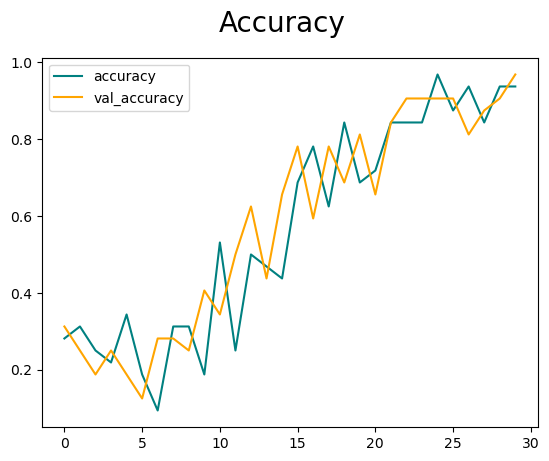

In [171]:
fig=plt.figure()
plt.plot(hist.history['accuracy'],color='teal',label='accuracy')
plt.plot(hist.history['val_accuracy'],color='orange',label='val_accuracy')
fig.suptitle('Accuracy',fontsize=20)
plt.legend(loc="upper left")
plt.show()

Evaluate Performance


In [172]:
from tensorflow.keras.metrics import Precision,Recall,SparseCategoricalAccuracy,CategoricalAccuracy

In [173]:
pre=Precision()
re=Recall()
acc=CategoricalAccuracy()

In [174]:
pre.reset_states()
re.reset_states()
acc.reset_states()

for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)
    print(y.shape)
    # Get predicted classes
    yhat_classes = np.argmax(yhat, axis=1)
    
    for actual, predicted in zip(y, yhat_classes):
        print(f"Actual: {actual}, Predicted: {predicted}")
    # Assuming 'pre', 're', 'acc' are instances of metrics classes
    pre.update_state(y, yhat_classes)
    re.update_state(y, yhat_classes)
    acc.update_state(y, yhat_classes)


1/1 [==============================] - 1s 690ms/step
(32,)
Actual: 1, Predicted: 1
Actual: 0, Predicted: 0
Actual: 1, Predicted: 1
Actual: 3, Predicted: 3
Actual: 3, Predicted: 3
Actual: 4, Predicted: 4
Actual: 2, Predicted: 2
Actual: 2, Predicted: 2
Actual: 1, Predicted: 1
Actual: 3, Predicted: 3
Actual: 3, Predicted: 3
Actual: 4, Predicted: 4
Actual: 2, Predicted: 2
Actual: 0, Predicted: 0
Actual: 4, Predicted: 1
Actual: 0, Predicted: 0
Actual: 4, Predicted: 4
Actual: 1, Predicted: 1
Actual: 1, Predicted: 1
Actual: 3, Predicted: 3
Actual: 4, Predicted: 4
Actual: 4, Predicted: 3
Actual: 2, Predicted: 2
Actual: 2, Predicted: 2
Actual: 4, Predicted: 4
Actual: 0, Predicted: 0
Actual: 3, Predicted: 3
Actual: 2, Predicted: 2
Actual: 0, Predicted: 0
Actual: 2, Predicted: 2
Actual: 4, Predicted: 4
Actual: 3, Predicted: 3


1/1 [==============================] - 1s 597ms/step
Actual: 1, Predicted: 1


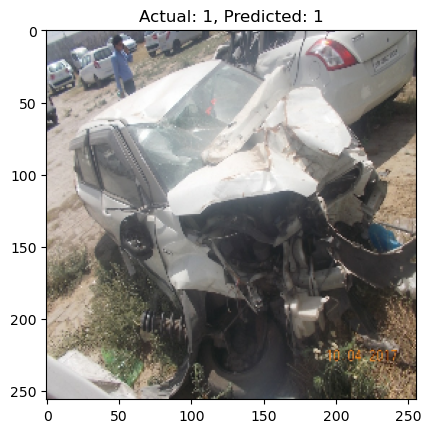

Actual: 3, Predicted: 3


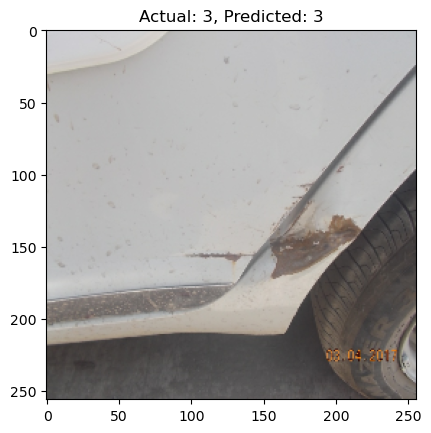

Actual: 2, Predicted: 2


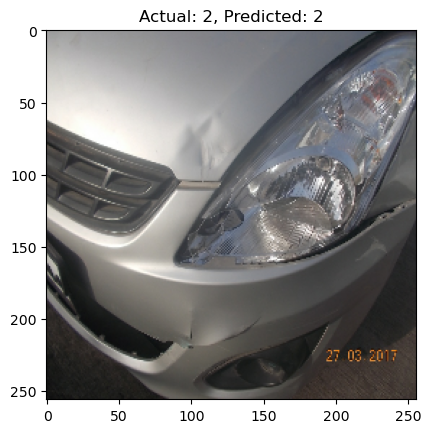

Actual: 1, Predicted: 1


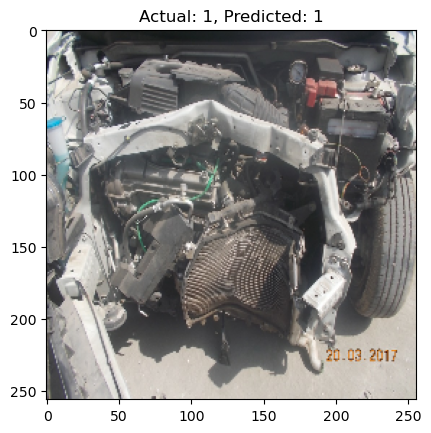

Actual: 2, Predicted: 2


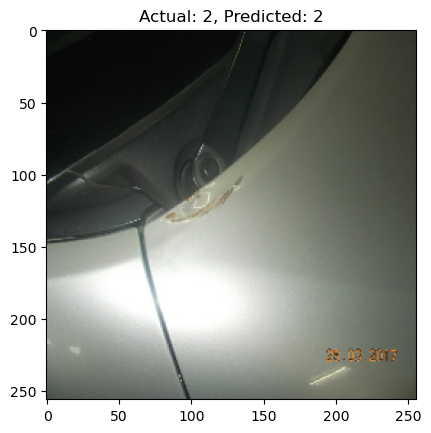

Actual: 0, Predicted: 0


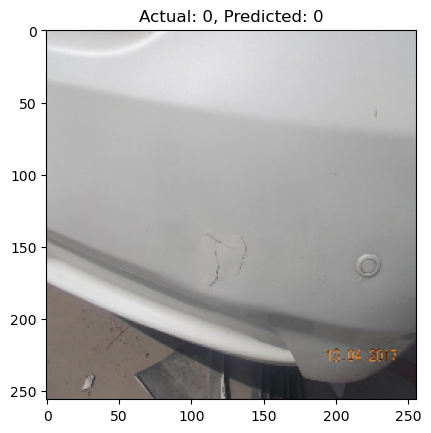

Actual: 4, Predicted: 4


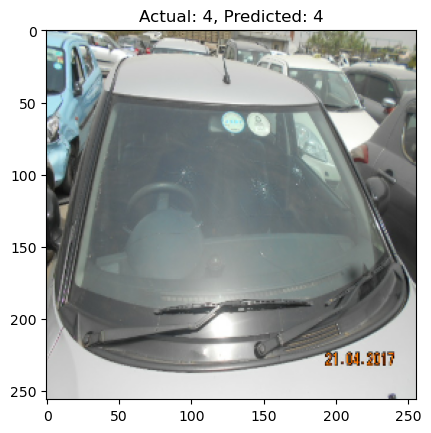

Actual: 1, Predicted: 1


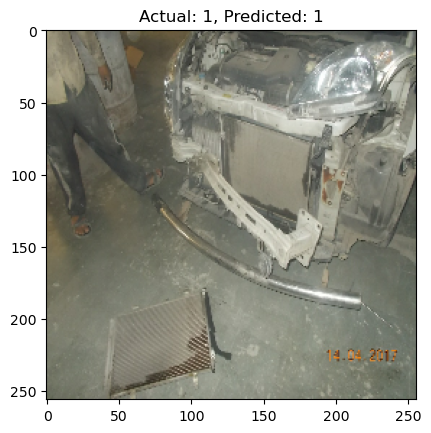

Actual: 3, Predicted: 3


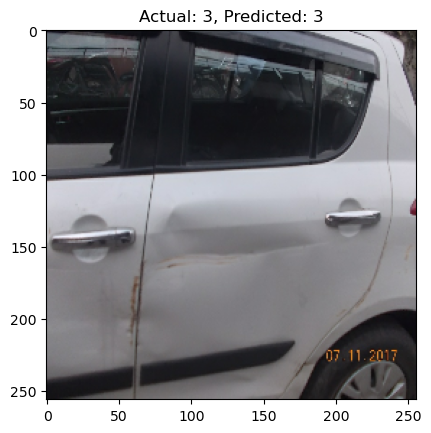

Actual: 3, Predicted: 3


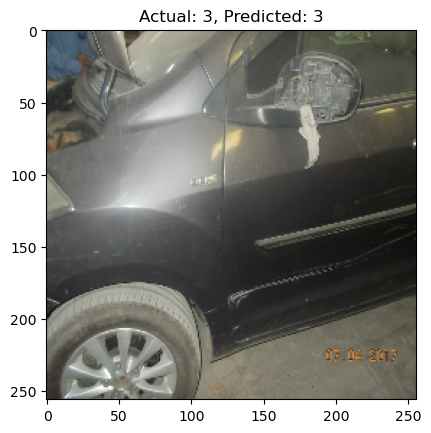

Actual: 3, Predicted: 3


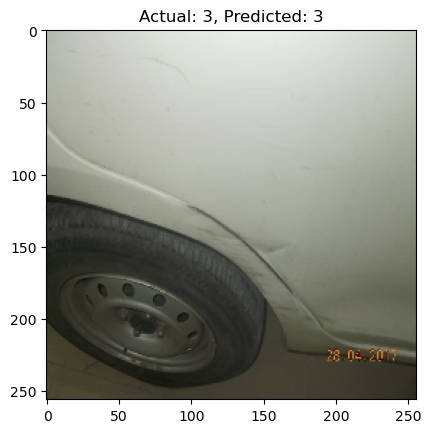

Actual: 0, Predicted: 0


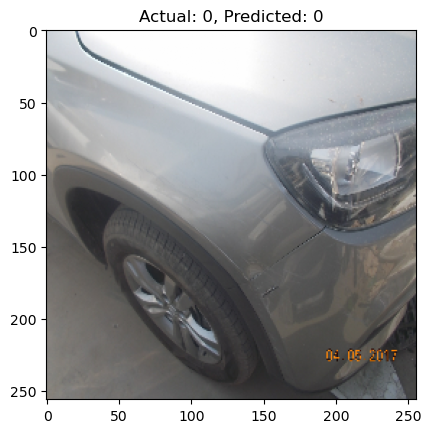

Actual: 3, Predicted: 3


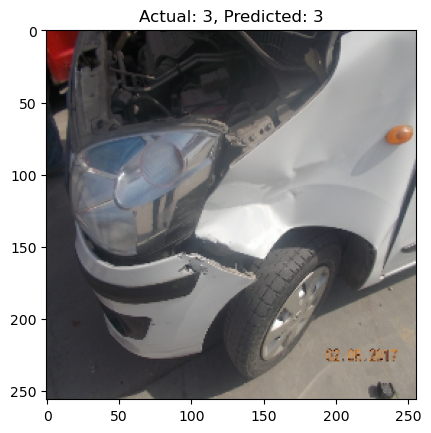

Actual: 3, Predicted: 3


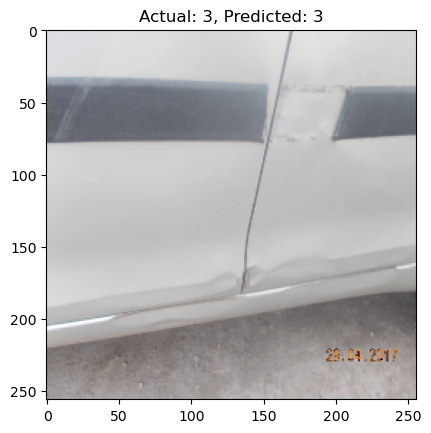

Actual: 4, Predicted: 4


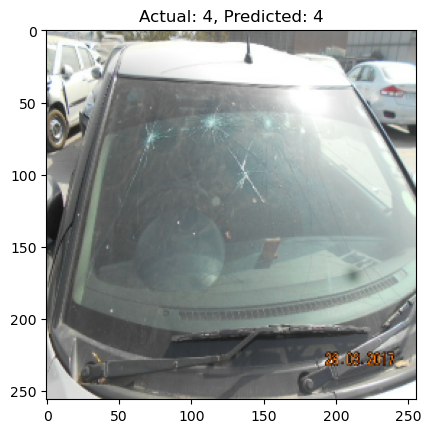

Actual: 3, Predicted: 3


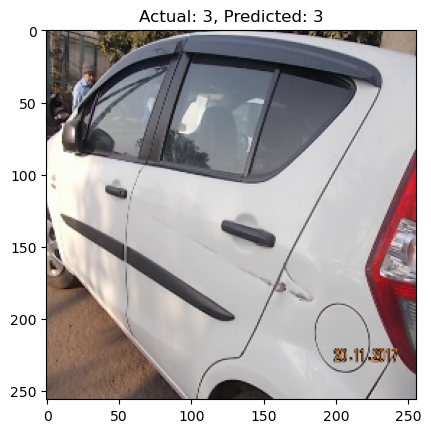

Actual: 2, Predicted: 2


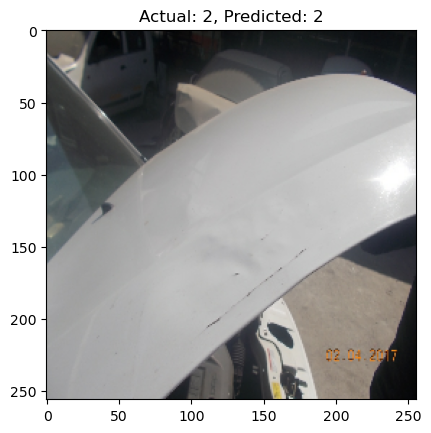

Actual: 3, Predicted: 3


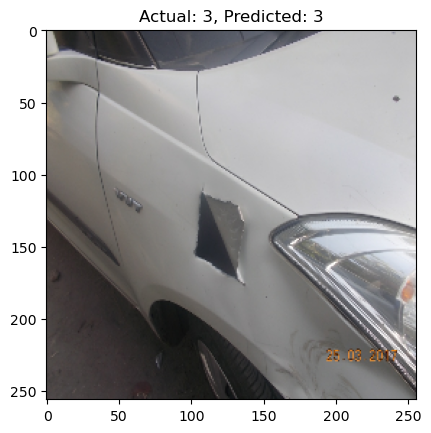

Actual: 1, Predicted: 1


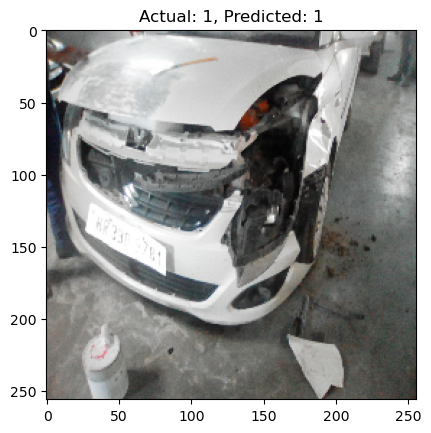

Actual: 2, Predicted: 2


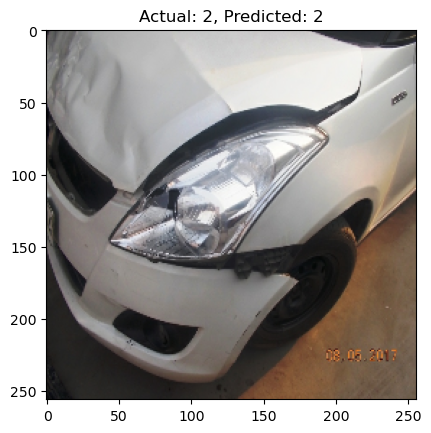

Actual: 1, Predicted: 1


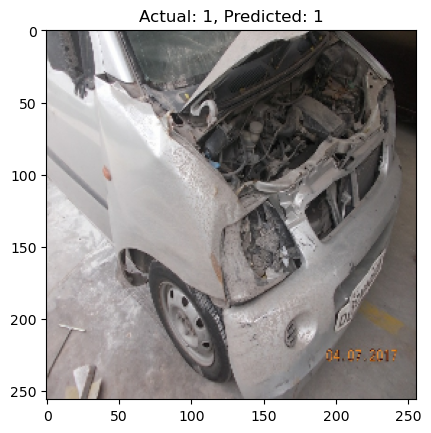

Actual: 1, Predicted: 1


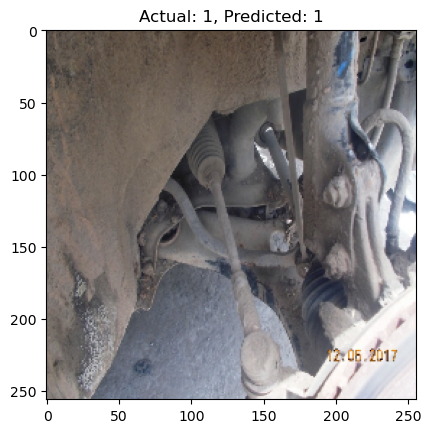

Actual: 1, Predicted: 1


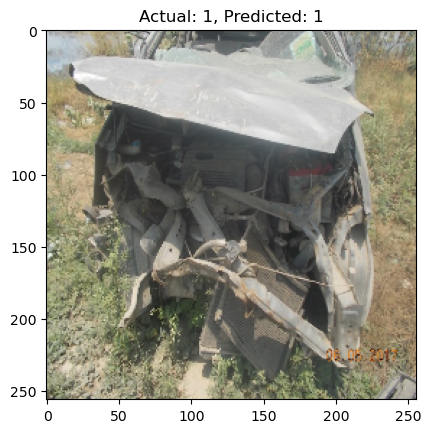

Actual: 0, Predicted: 0


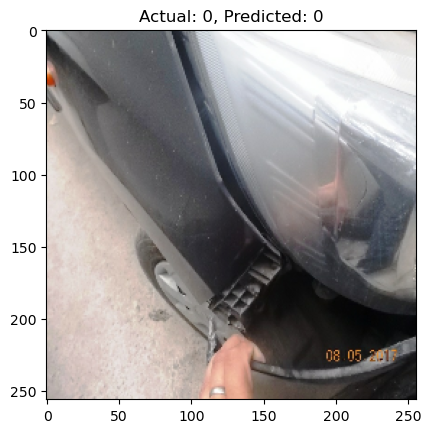

Actual: 2, Predicted: 2


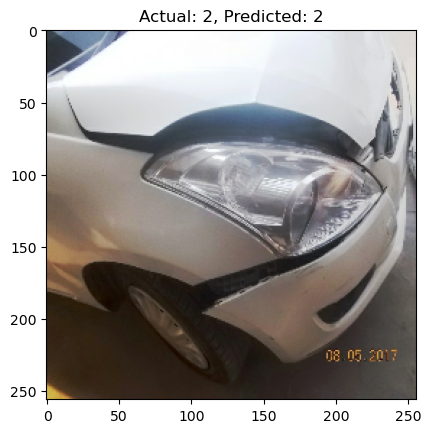

Actual: 2, Predicted: 2


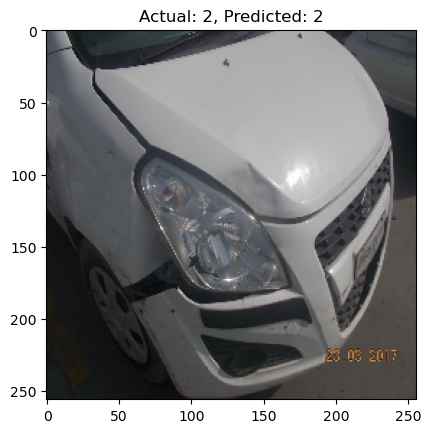

Actual: 0, Predicted: 0


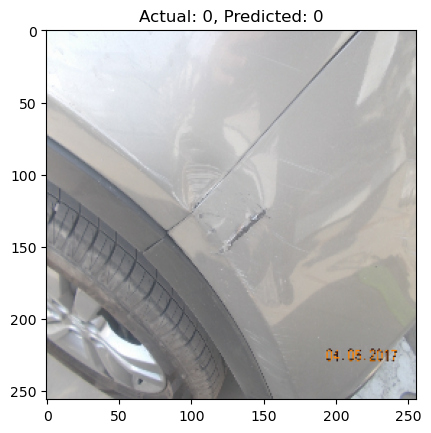

Actual: 2, Predicted: 2


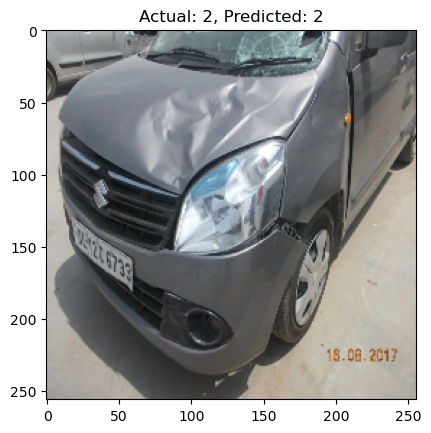

Actual: 1, Predicted: 1


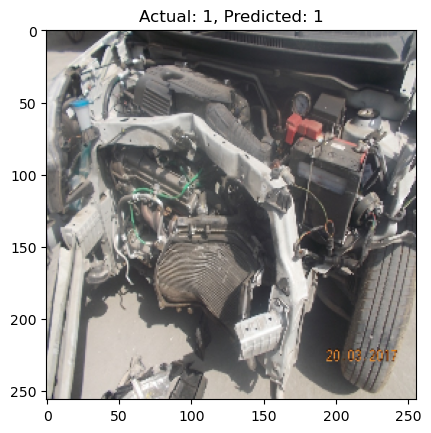

Actual: 2, Predicted: 2


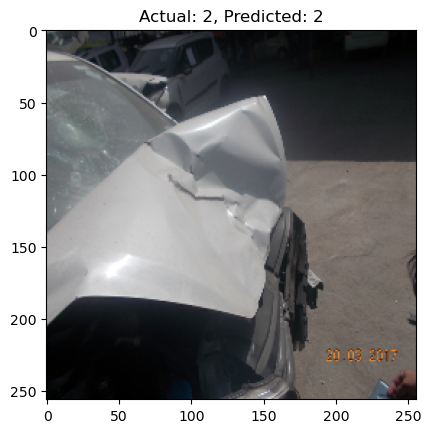

Actual: 0, Predicted: 0


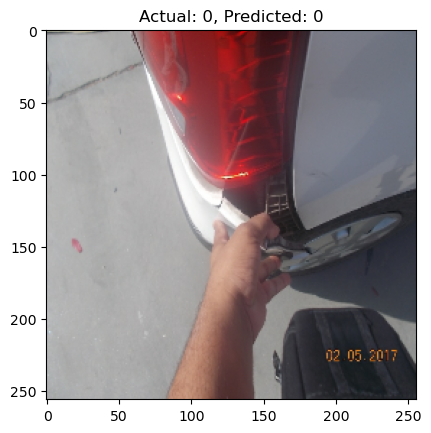

Actual: 3, Predicted: 3


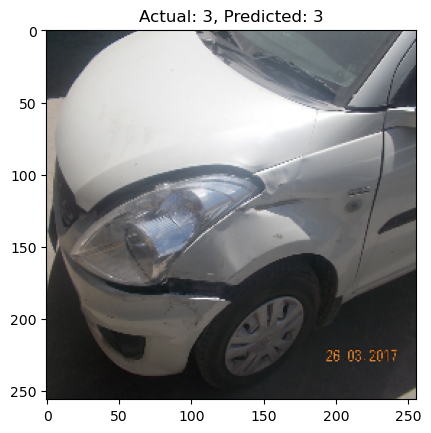

(32,) (32,)


In [175]:


pre.reset_states()
re.reset_states()
acc.reset_states()

for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Get predicted classes
    yhat_classes = np.argmax(yhat, axis=1)

    for i in range(len(y)):
        actual = y[i]
        predicted = yhat_classes[i]

        # Print actual and predicted labels
        print(f"Actual: {actual}, Predicted: {predicted}")

        # Display the image
        plt.imshow(X[i])
        plt.title(f"Actual: {actual}, Predicted: {predicted}")
        plt.show()
    print(y.shape,yhat_classes.shape)
    # Assuming 'pre', 're', 'acc' are instances of metrics classes
    pre.update_state(y, yhat_classes)
    re.update_state(y, yhat_classes)
    acc.update_state(y, yhat_classes)




1/1 [==============================] - 1s 876ms/step
Actual: [0. 0. 0. 0. 1.], Predicted: [1. 0. 0. 0. 0.]


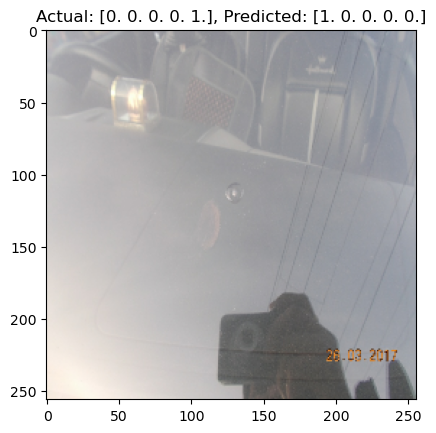

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


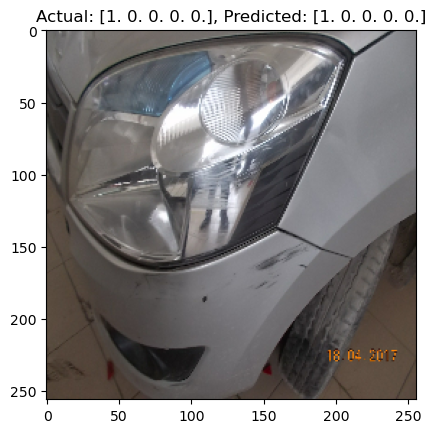

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


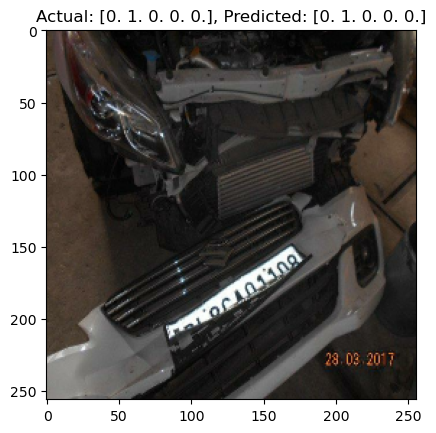

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


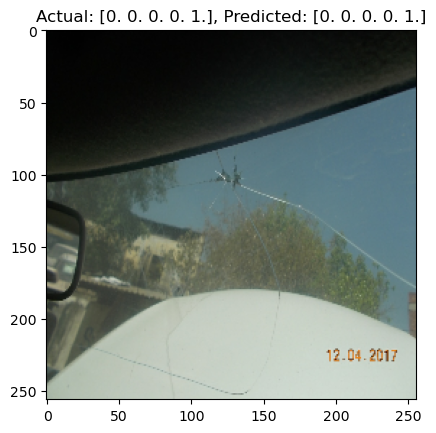

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


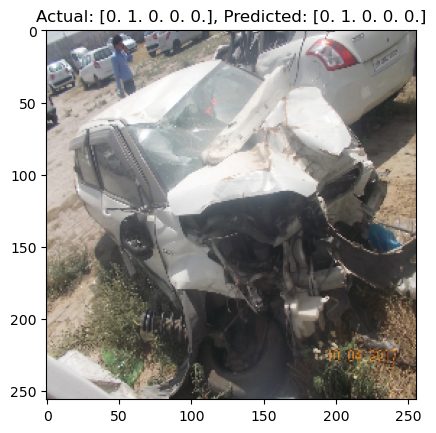

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


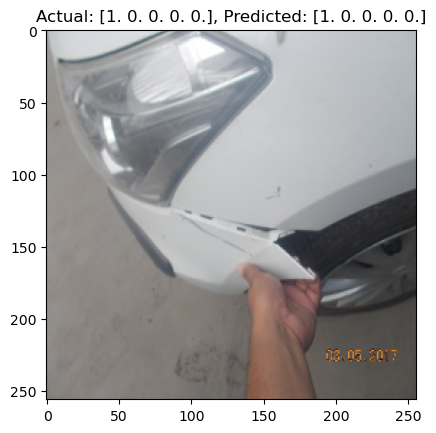

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


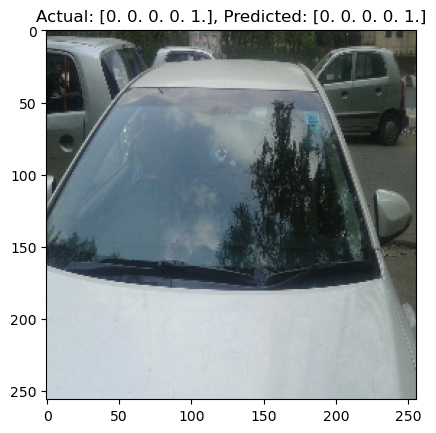

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


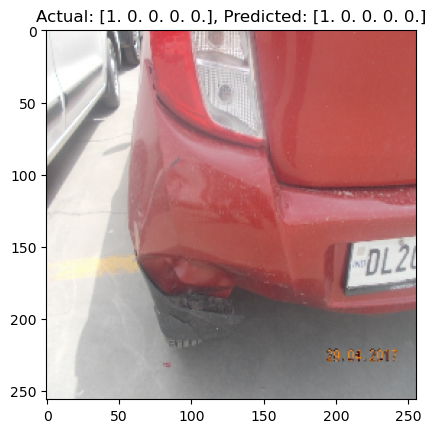

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


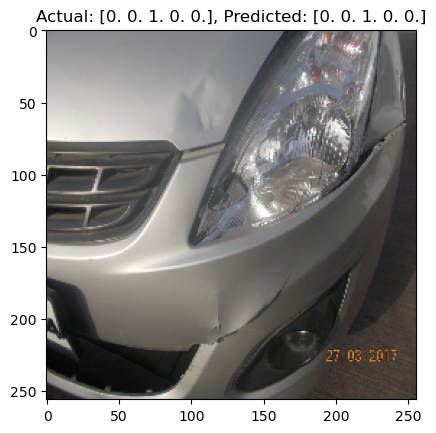

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


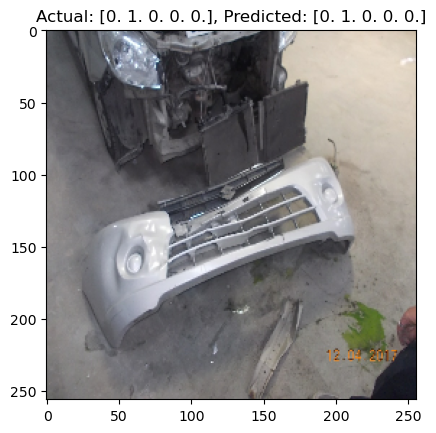

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


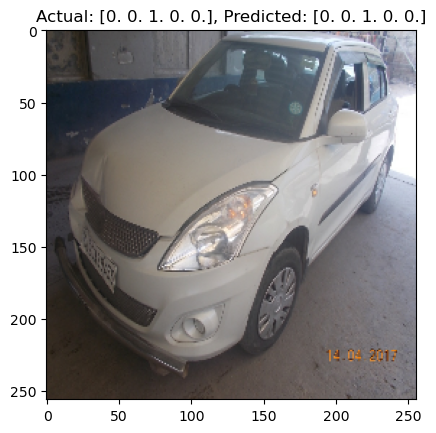

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


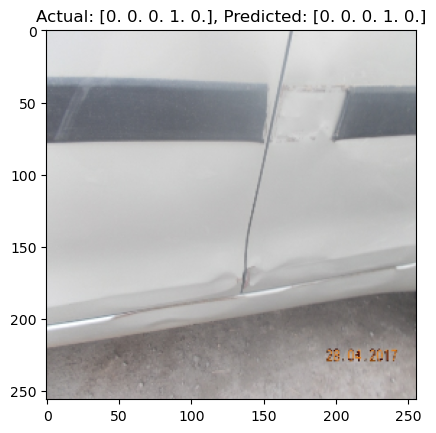

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


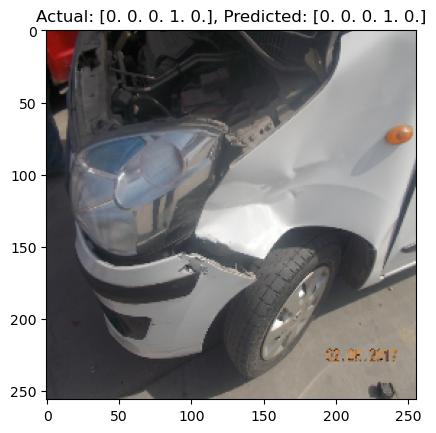

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


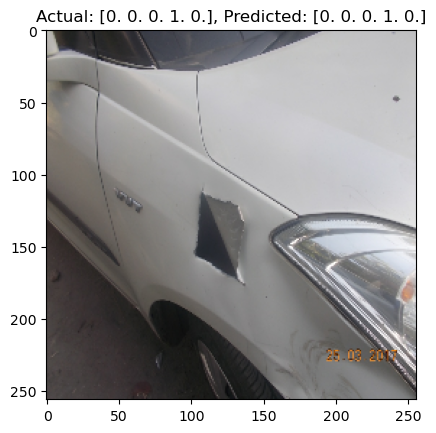

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


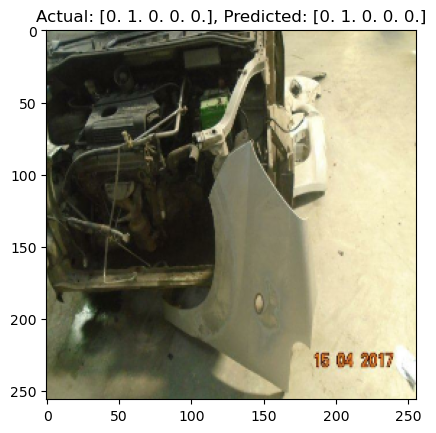

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


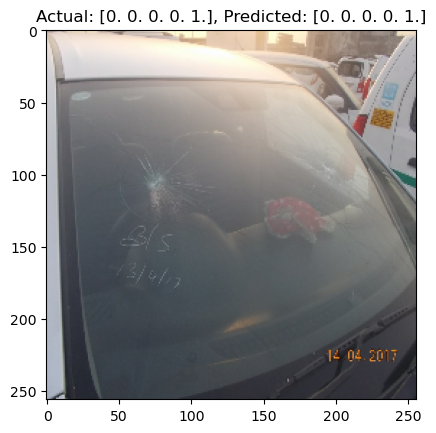

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 1. 0. 0. 0.]


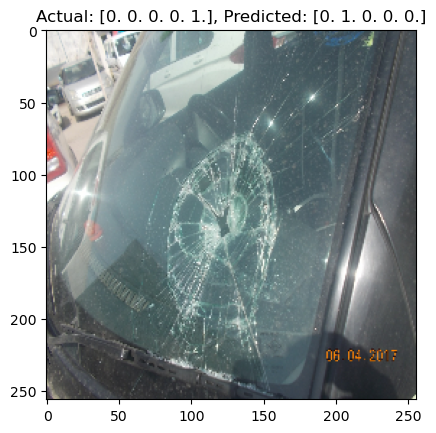

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


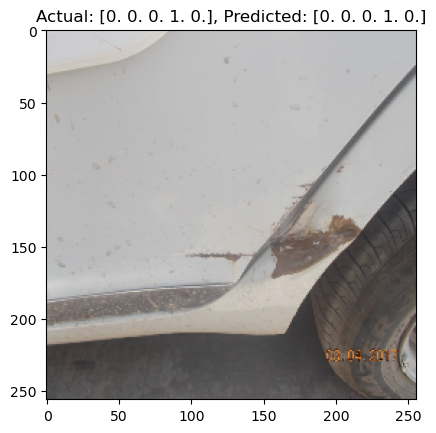

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


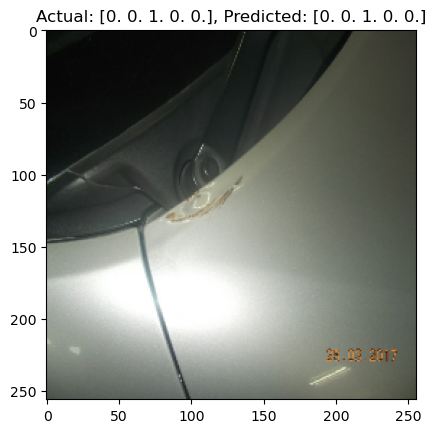

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


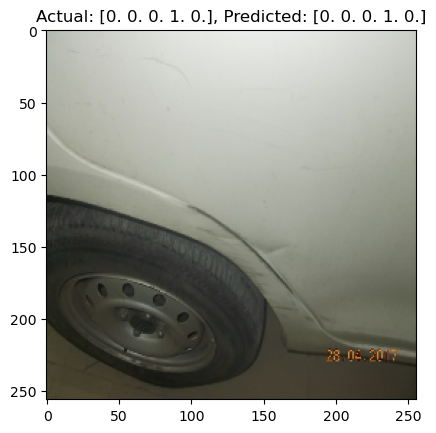

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


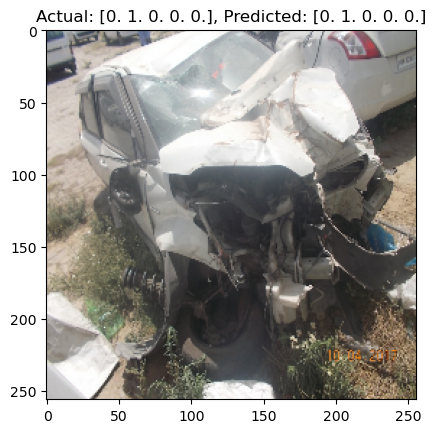

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 0. 1.]


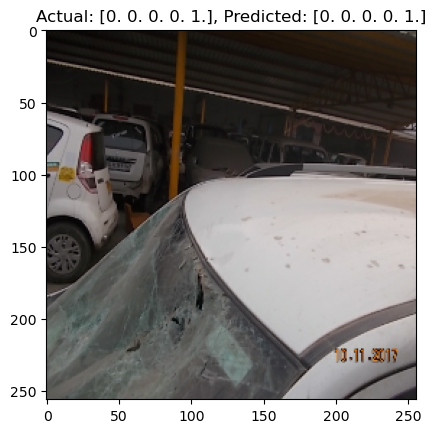

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


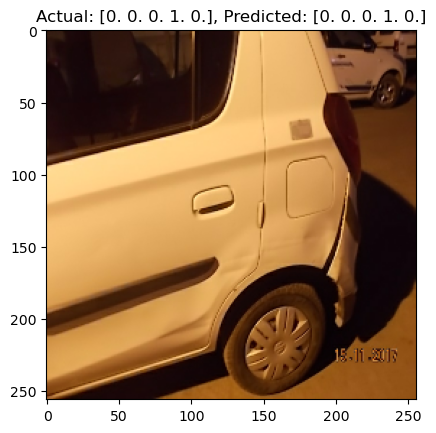

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


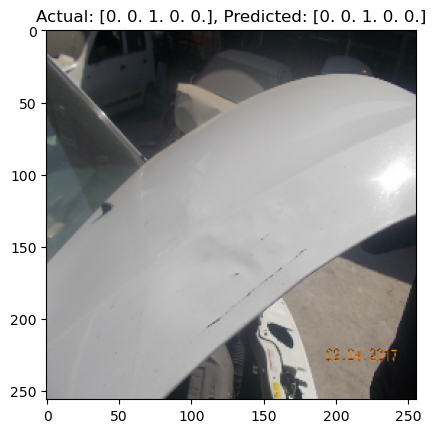

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


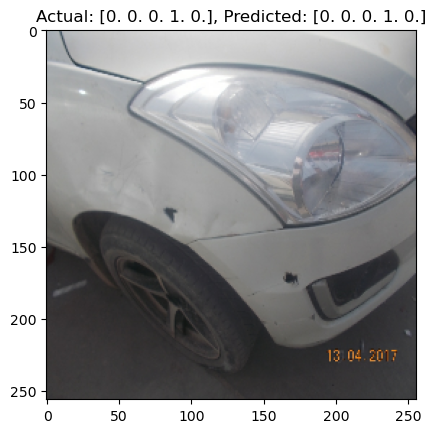

Actual: [0. 0. 0. 0. 1.], Predicted: [0. 0. 0. 1. 0.]


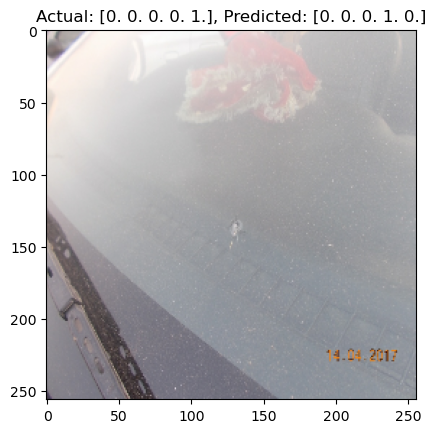

Actual: [0. 0. 1. 0. 0.], Predicted: [0. 0. 1. 0. 0.]


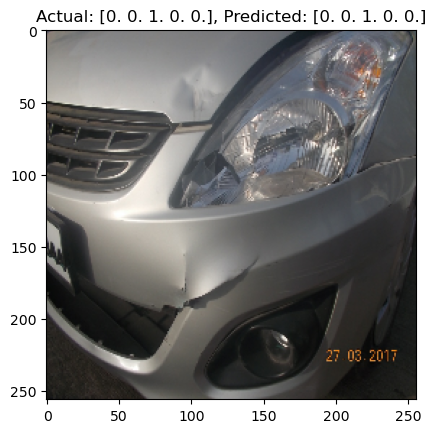

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


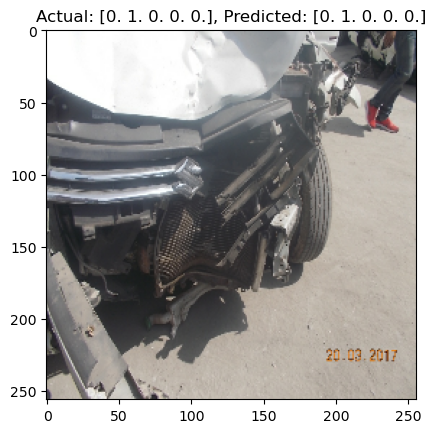

Actual: [0. 0. 0. 1. 0.], Predicted: [0. 0. 0. 1. 0.]


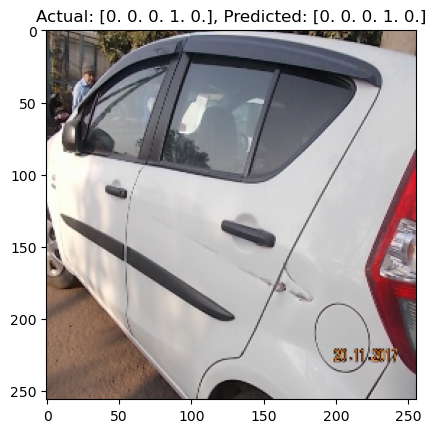

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


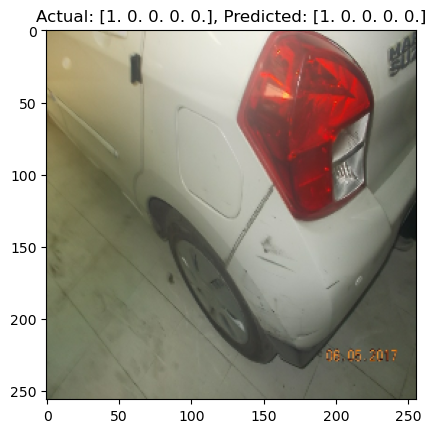

Actual: [1. 0. 0. 0. 0.], Predicted: [1. 0. 0. 0. 0.]


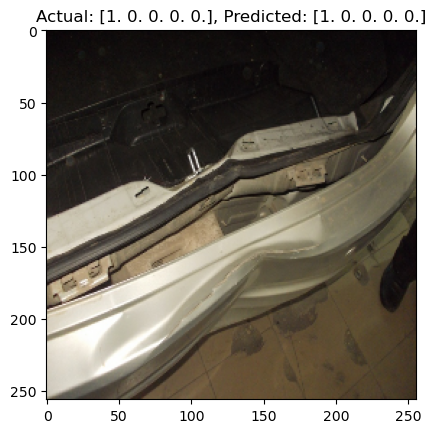

Actual: [0. 1. 0. 0. 0.], Predicted: [0. 1. 0. 0. 0.]


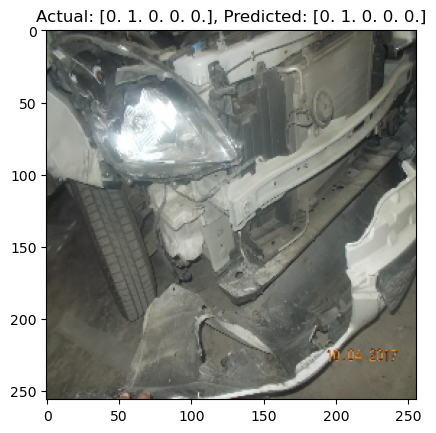

Precision: 0.9354838728904724, Recall: 0.90625, Accuracy: 0.90625


In [176]:
pre.reset_states()
re.reset_states()
acc.reset_states()

for batch in test.as_numpy_iterator():
    X, y = batch
    yhat = model.predict(X)

    # Get predicted classes
    yhat_classes = np.argmax(yhat, axis=1)

    # One-hot encode the labels
    y_one_hot = tf.keras.utils.to_categorical(y, num_classes=num_classes)

    for i in range(len(y)):
        actual = y_one_hot[i]
        predicted = tf.one_hot(yhat_classes[i], depth=num_classes)

        # Print actual and predicted labels
        print(f"Actual: {actual}, Predicted: {predicted}")

        # Display the image
        plt.imshow(X[i])
        plt.title(f"Actual: {actual}, Predicted: {predicted}")
        plt.show()

    # Assuming 'pre', 're', 'acc' are instances of metrics classes
    pre.update_state(y_one_hot, yhat)
    re.update_state(y_one_hot, yhat)
    acc.update_state(y_one_hot, yhat)

pre_result = pre.result().numpy()
re_result = re.result().numpy()
acc_result = acc.result().numpy()

print(f'Precision: {pre_result}, Recall: {re_result}, Accuracy: {acc_result}')


In [177]:
print(f"Precision:{pre.result().numpy()}, Recall:{re.result().numpy()}, Accuracy:{acc.result().numpy()}")

Precision:0.9354838728904724, Recall:0.90625, Accuracy:0.90625


Test

In [178]:
import cv2

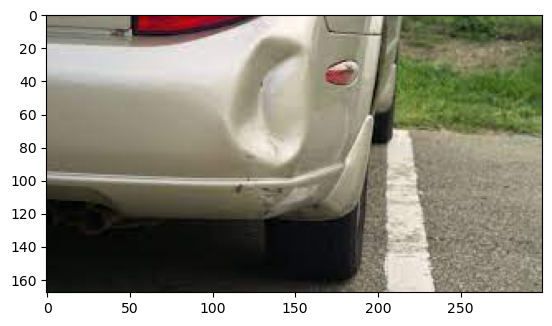

In [199]:
img=cv2.imread('test_img4.jpg')
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
plt.show()

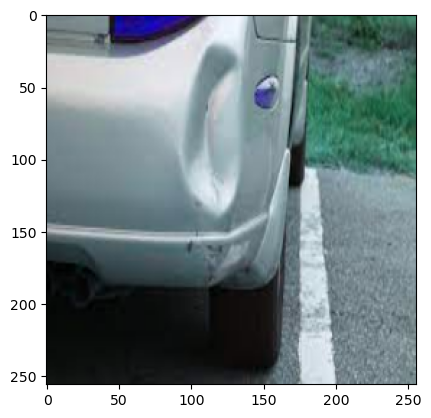

In [200]:
resize=tf.image.resize(img,(256,256))
plt.imshow(resize.numpy().astype(int))
plt.show()

In [201]:
yhat=model.predict(np.expand_dims(resize/255,0))

1/1 [==============================] - 0s 66ms/step


In [202]:
predicted_class = np.argmax(yhat)
print(f'Predicted Class: {predicted_class}')

Predicted Class: 2


In [183]:
yhat

array([[1.6874625e-05, 9.9997783e-01, 4.3622572e-06, 7.7870529e-11,
        9.7397606e-07]], dtype=float32)